## Importing Libraries

In [1]:
# Supress Warnings

import warnings
warnings.filterwarnings('ignore')

In [2]:
# for basic operations
import numpy as np
import pandas as pd

# for data visualizations
import matplotlib.pyplot as plt
import seaborn as sns

# for interactivity
import ipywidgets as widgets
from ipywidgets import interact
from ipywidgets import interact_manual

# for interactive shells
from IPython.display import display

# seting for charts
plt.rcParams['figure.figsize'] = (15, 7)
plt.style.use('fivethirtyeight')

In [3]:
# lets import the dataset
jobs = pd.read_csv('jobs.csv')

In [4]:
# lets check the shapes of the datasets used 
print("Shape of Jobs Data :", jobs.shape)

Shape of Jobs Data : (66, 14)


In [5]:
# lets check the null values in the data
print("Null values in Jobs Data :", jobs.isnull().sum().sum())

Null values in Jobs Data : 0


In [6]:
# lets check the head of the jobs data
jobs.head()

,ID,JobFamily,JobFamilyDescription,JobClass,JobClassDescription,PayGrade,EducationLevel,Experience,OrgImpact,ProblemSolving,Supervision,ContactLevel,FinancialBudget,PG
0,1,1,Accounting And Finance,1,Accountant I,5,3,1,3,3,4,3,5,PG05
1,2,1,Accounting And Finance,2,Accountant II,6,4,1,5,4,5,7,7,PG06
2,3,1,Accounting And Finance,3,Accountant III,8,4,2,6,5,6,7,10,PG08
3,4,1,Accounting And Finance,4,Accountant IV,10,5,5,6,6,7,8,11,PG10
4,5,2,Administrative Support,5,Admin Support I,1,1,0,1,1,1,1,1,PG01


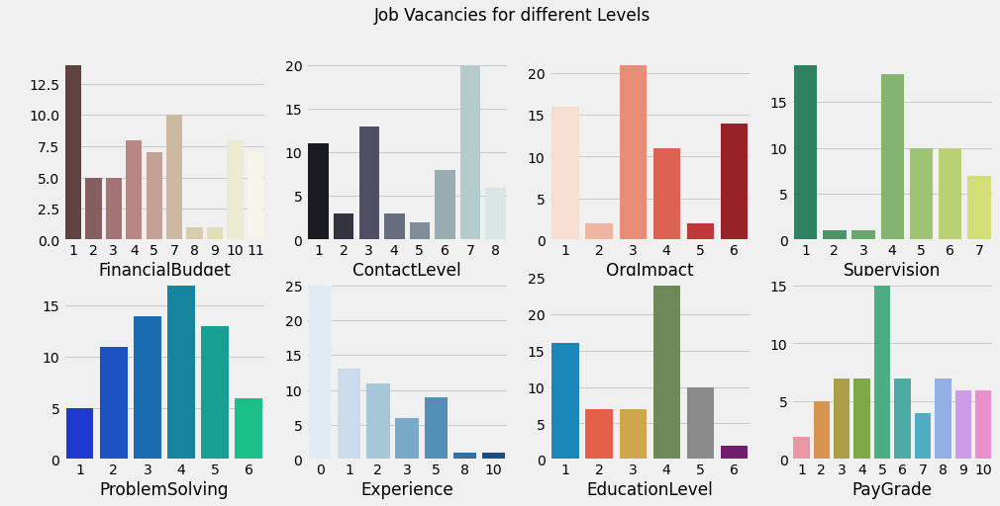

In [7]:
plt.subplot(2, 4, 1)
sns.countplot(jobs['FinancialBudget'], palette = 'pink')
plt.ylabel(" ")

plt.subplot(2, 4, 2)
sns.countplot(jobs['ContactLevel'], palette = 'bone')
plt.ylabel(" ")

plt.subplot(2, 4, 3)
sns.countplot(jobs['OrgImpact'], palette = 'Reds')
plt.ylabel(" ")

plt.subplot(2, 4, 4)
sns.countplot(jobs['Supervision'], palette = 'summer')
plt.ylabel(" ")

plt.subplot(2, 4, 5)
sns.countplot(jobs['ProblemSolving'], palette = 'winter')
plt.ylabel(" ")

plt.subplot(2, 4, 6)
sns.countplot(jobs['Experience'], palette = 'Blues')
plt.ylabel(" ")

plt.subplot(2, 4, 7)
sns.countplot(jobs['EducationLevel'])
plt.ylabel(" ")

plt.subplot(2, 4, 8)
sns.countplot(jobs['PayGrade'])
plt.ylabel(" ")

plt.suptitle('Job Vacancies for different Levels',)
plt.show()

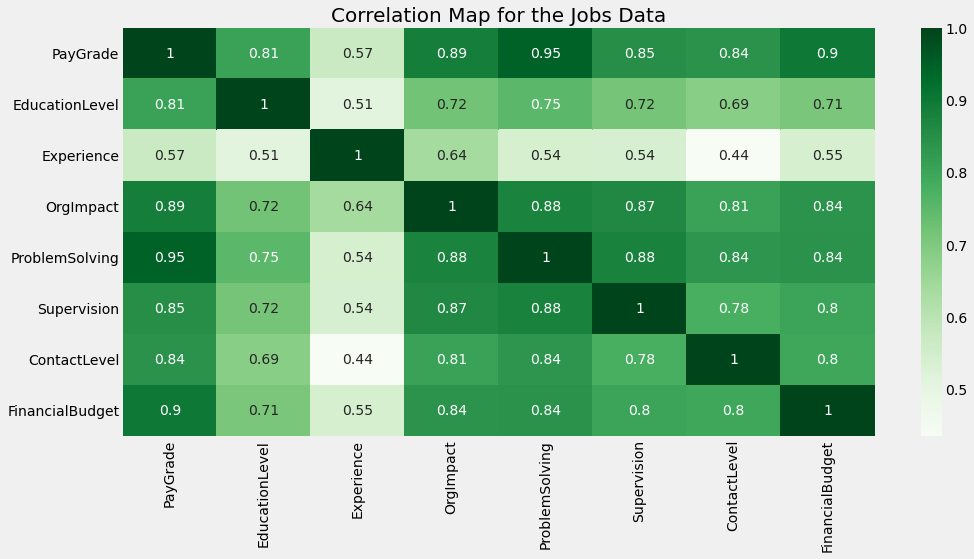

In [8]:
# lets check the correlation map

sns.heatmap(jobs[['PayGrade','EducationLevel',
                  'Experience','OrgImpact','ProblemSolving',
                  'Supervision','ContactLevel','FinancialBudget']].corr(),
            cmap = 'Greens',
            annot = True)
plt.title('Correlation Map for the Jobs Data', fontsize = 20)
plt.show()

In [9]:
# lets group the data wrt jobs family

x = jobs.groupby(['JobFamilyDescription']).agg('mean')
x = x.drop(['ID','JobFamily','JobClass'], axis = 1)
x.style.background_gradient(cmap = 'Reds')

,PayGrade,EducationLevel,Experience,OrgImpact,ProblemSolving,Supervision,ContactLevel,FinancialBudget
JobFamilyDescription,,,,,,,,
Accounting And Finance,7.250000,4.000000,2.250000,5.000000,4.500000,5.500000,6.250000,8.250000
Administrative Support,3.000000,2.200000,0.600000,1.600000,1.800000,1.800000,3.200000,3.800000
Baker,6.333333,2.000000,0.000000,2.666667,4.333333,2.333333,4.333333,5.333333
Buildings And Facilities,5.500000,2.375000,0.500000,3.000000,3.750000,4.125000,5.000000,5.000000
Buyer,7.333333,3.333333,3.666667,5.000000,4.333333,5.333333,5.666667,7.333333
Cashier,3.333333,2.666667,2.333333,2.666667,2.666667,3.666667,3.333333,3.000000
Communications And Media,4.500000,2.500000,0.300000,2.000000,2.900000,2.800000,4.000000,3.800000
Corporate Research,5.800000,4.000000,2.400000,3.400000,3.600000,3.800000,3.400000,5.200000
Finance And Accounting,6.666667,4.000000,2.000000,4.000000,4.333333,5.000000,5.333333,7.333333


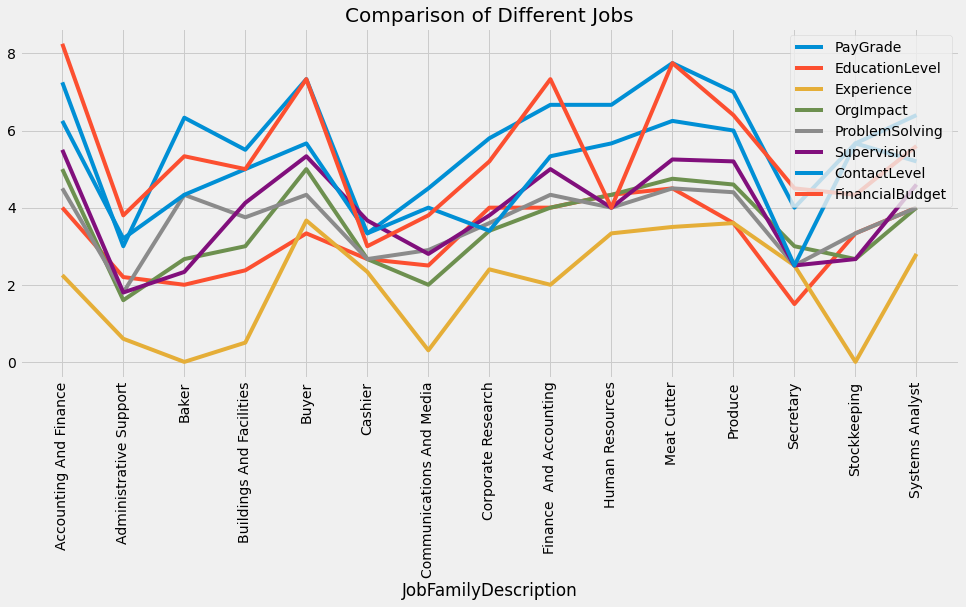

In [10]:
# lets compare all attributes at once
plt.rcParams['figure.figsize'] = (15, 6)
plt.style.use('fivethirtyeight')

x.plot()
plt.xticks(np.arange(15), ('Accounting And Finance', 'Administrative Support', 'Baker',
       'Buildings And Facilities', 'Buyer', 'Cashier',
       'Communications And Media', 'Corporate Research',
       'Finance  And Accounting', 'Human Resources', 'Meat Cutter', 'Produce',
       'Secretary', 'Stockkeeping', 'Systems Analyst'),
        rotation = 90)
plt.title('Comparison of Different Jobs', fontsize = 20)
plt.show()

In [11]:
# lets make an Interactive visualization

@interact_manual
def check(column = jobs.select_dtypes('number').columns[3:],
          column1 = jobs.select_dtypes('number').columns[4:],):
    sns.barplot(jobs[column], jobs[column1])
    plt.xticks(rotation = 90)
    plt.show()

interactive(children=(Dropdown(description='column', options=('PayGrade', 'EducationLevel', 'Experience', 'Org…

In [12]:
# lets check the head of naukri
data = pd.read_csv('naukri.csv')

In [13]:
# lets check the shape of the dataset
data.shape

(22000, 14)

In [14]:
# lets check the head of the dataset
data.head(50)

,company,education,experience,industry,jobdescription,jobid,joblocation_address,jobtitle,numberofpositions,payrate,postdate,site_name,skills,uniq_id
0,MM Media Pvt Ltd,UG: B.Tech/B.E. - Any Specialization PG:Any Po...,0 - 1 yrs,Media / Entertainment / Internet,Job Description Send me Jobs like this Quali...,210516002263,Chennai,Walkin Data Entry Operator (night Shift),NaN,"1,50,000 - 2,25,000 P.A",2016-05-21 19:30:00 +0000,NaN,ITES,43b19632647068535437c774b6ca6cf8
1,find live infotech,UG: B.Tech/B.E. - Any Specialization PG:MBA/PG...,0 - 0 yrs,Advertising / PR / MR / Event Management,Job Description Send me Jobs like this Quali...,210516002391,Chennai,Work Based Onhome Based Part Time.,60.0,"1,50,000 - 2,50,000 P.A. 20000",2016-05-21 19:30:00 +0000,NaN,Marketing,d4c72325e57f89f364812b5ed5a795f0
2,Softtech Career Infosystem Pvt. Ltd,UG: Any Graduate - Any Specialization PG:Any P...,4 - 8 yrs,IT-Software / Software Services,Job Description Send me Jobs like this - as ...,101016900534,Bengaluru,Pl/sql Developer - SQL,NaN,Not Disclosed by Recruiter,2016-10-13 16:20:55 +0000,NaN,IT Software - Application Programming,c47df6f4cfdf5b46f1fd713ba61b9eba
3,Onboard HRServices LLP,UG: Any Graduate - Any Specialization PG:CA Do...,11 - 15 yrs,Banking / Financial Services / Broking,Job Description Send me Jobs like this - Inv...,81016900536,"Mumbai, Bengaluru, Kolkata, Chennai, Coimbator...",Manager/ad/partner - Indirect Tax - CA,NaN,Not Disclosed by Recruiter,2016-10-13 16:20:55 +0000,NaN,Accounts,115d28f140f694dd1cc61c53d03c66ae
4,Spire Technologies and Solutions Pvt. Ltd.,UG: B.Tech/B.E. - Any Specialization PG:Any Po...,6 - 8 yrs,IT-Software / Software Services,Job Description Send me Jobs like this Pleas...,120916002122,Bengaluru,JAVA Technical Lead (6-8 yrs) -,4.0,Not Disclosed by Recruiter,2016-10-13 16:20:55 +0000,NaN,IT Software - Application Programming,a12553fc03bc7bcced8b1bb8963f97b4
5,PFS Web Global Services Pvt Ltd,UG: B.Tech/B.E. - Any Specialization PG:MCA - ...,2 - 5 yrs,IT-Software / Software Services,Job Description Send me Jobs like this We ar...,131016005070,Bengaluru,WALK IN - As400 Developer - Pfsweb Global Serv...,NaN,Not Disclosed by Recruiter,2016-10-13 16:20:55 +0000,NaN,IT Software - Application Programming,8c3af9062ea835b0965779e2c7faac76
6,Kinesis Management Consultant Pvt. Ltd,NaN,1 - 3 yrs,IT-Software / Software Services,Job Description Send me Jobs like this exper...,131016004451,"Delhi NCR, Mumbai, Bengaluru, Kochi, Greater N...",PHP Developer,2.0,"3,00,000 - 6,50,000 P.A",2016-10-13 16:20:55 +0000,NaN,IT Software - Application Programming,98f84958cd6409386e7f0c9e447b8510
7,Agile HR consultancy Pvt. Ltd. hiring for Ross...,"UG: Diploma - Any Specialization, Electrical, ...",2 - 7 yrs,Aviation / Aerospace Firms,Job Description Send me Jobs like this Job D...,121016002995,Bengaluru,Member Technical Staff-wire Harness/cable Harn...,20.0,Not Disclosed by Recruiter,2016-10-13 16:20:55 +0000,NaN,Production,c811c10568fdbfdb3d5e633c99c914b4
8,HANSUM INDIA ELECTRONICS PVT.LTD.,"UG: Diploma - Any Specialization, Electronics/...",1 - 3 yrs,Industrial Products / Heavy Machinery,Job Description Send me Jobs like this Indep...,131016002120,Bengaluru,Team Leader,2.0,"1,00,000 - 2,00,000 P.A",2016-10-13 16:20:55 +0000,NaN,Production,a40cb270401af0c246dbe60dcf219262
9,Accenture,UG: Any Graduate - Any Specialization PG:Any P...,1 - 5 yrs,IT-Software / Software Services,Job Description Send me Jobs like this Overa...,121016901354,Bengaluru,German Translator,NaN,Not Disclosed by Recruiter,2016-10-13 16:20:55 +0000,NaN,ITES,7774df1c672c0b92486da8b36a721638


## Cleaning the Job Location Address

In [15]:

data['joblocation_adress'] = data['joblocation_address'].str.split(',')
pd.set_option('max_rows', 300000)
data['joblocation_adress']

0                                                [Chennai]
1                                                [Chennai]
2                                              [Bengaluru]
3        [Mumbai,  Bengaluru,  Kolkata,  Chennai,  Coim...
4                                              [Bengaluru]
5                                              [Bengaluru]
6        [Delhi NCR,  Mumbai,  Bengaluru,  Kochi,  Grea...
7                                              [Bengaluru]
8                                              [Bengaluru]
9                                              [Bengaluru]
10                            [Mumbai,  Delhi,  Bengaluru]
11                                             [Bengaluru]
12                                             [Bengaluru]
13                                             [Bengaluru]
14                                             [Bengaluru]
15                                             [Bengaluru]
16                                             [Bengalur

In [16]:
data = data.explode('joblocation_adress')
pd.set_option('max_rows', 30000)
data['joblocation_adress'].value_counts()

Bengaluru/Bangalore                               3775
Mumbai                                            2593
Bengaluru/Bangalore                               2134
Bengaluru                                         2026
 Mumbai                                           1378
Chennai                                           1290
Hyderabad / Secunderabad                          1246
Hyderabad                                         1154
Mumbai                                            1067
 Mumbai                                            923
 Chennai                                           905
Delhi                                              790
Noida                                              777
Gurgaon                                            762
 Chennai                                           738
 Hyderabad / Secunderabad                          700
Delhi                                              680
 Pune                                              645
 Delhi    

In [17]:

data['joblocation_adress'] = data['joblocation_adress'].replace(('(Bengaluru/Bangalore)',' Bangalore',
                                                                ' Bangalore ','Bangalore ','Bengaluru/Bangalore ',
                                                                 ' Bengaluru/Bangalore ',' Bengaluru/Bangalore',
                                                                'Bengaluru/Bangalore','Bengaluru','NCR Bangalore',
                                                                'NCR Bangalore ','Near Bangalore', ' Bengaluru/Bangalore',
                                                                 ' Bengaluru/Bangalore ', ' Bengaluru',
                                                                 'Bangalore , Bangalore / Bangalore',
                                                                 'Bangalore , karnataka',' Bengaluru / Bangalore', 
                                                                 ' Bengaluru / Bangalore ', 'Bengaluru Bangalore',
                                                                 'India-Karnataka-Bangalore',' bangalore',' karnataka',
                                                                ' Bengaluru Bangalore'),
                                                                ('Bangalore','Bangalore','Bangalore','Bangalore','Bangalore',
                                                                'Bangalore','Bangalore','Bangalore','Bangalore','Bangalore',
                                                                'Bangalore','Bangalore','Bangalore','Bangalore','Bangalore',
                                                                 'Bangalore','Bangalore', 'Bangalore','Bangalore','Bangalore',
                                                                'Bangalore','Bangalore','Bangalore','Bangalore',))
                                                                
data['joblocation_adress'] = data['joblocation_adress'].replace(('Hyderabad / Secunderabad',' Hyderabad / Secunderabad',
                                                                 ' Hyderabad / Secunderabad ','Hyderabad / Secunderabad ',
                                                                ' Hyderabad','Hyderabad ',' Hyderabad ',
                                                                 'Hyderabad/Secunderabad','Hyderabad/Secunderabad ',
                                                                ' Hyderabad/Secunderabad ',' Hyderabad/Secunderabad',),
                                                                ('Hyderabad', 'Hyderabad','Hyderabad','Hyderabad',
                                                                 'Hyderabad', 'Hyderabad','Hyderabad','Hyderabad',
                                                                'Hyderabad','Hyderabad','Hyderabad'))


  
data['joblocation_adress'] = data['joblocation_adress'].replace(('NAVI MUMBAI',' NAVI MUMBAI','NAVI MUMBAI ',
                                                                 ' NAVI MUMBAI',' NAVI MUMBAI ','Mumbai , Mumbai',
                                                                 ' Mumbai',' Mumbai ','Mumbai ','mumbai','Navi Mumbai',
                                                                ' Navi Mumbai',' Navi Mumbai ','Navi Mumbai ', 
                                                                 ' Mumbai Suburbs','Mumbai Suburbs ','Mumbai Suburbs',
                                                                ' Mumbai Suburbs ','mumbai',' mumbai','mumbai ',
                                                                 ' maharashtra'),
                                                                ('Mumbai','Mumbai','Mumbai','Mumbai','Mumbai','Mumbai',
                                                                 'Mumbai','Mumbai','Mumbai', 'Mumbai','Mumbai','Mumbai',
                                                                'Mumbai','Mumbai','Mumbai','Mumbai','Mumbai','Mumbai','Mumbai',
                                                                'Mumbai','Mumbai', 'Mumbai'))

data['joblocation_adress'] = data['joblocation_adress'].replace(('Noida','Noida ',' Noida',' Delhi','Delhi','Delhi ',' Delhi ',
                                                                 'Gurgaon',' Gurgaon',' Gurgaon ','Gurgaon ', ' noida',
                                                                 ' Noida/Greater Noida',' Noida ', ' Delhi NCR',
                                                                 'Delhi/NCR(National Capital Region)',' Delhi/NCR ',
                                                                 ' Delhi/NCR(National Capital Region)',
                                                                 ' Delhi/NCR(National Capital Region) ',
                                                                 'Delhi/NCR(National Capital Region) ','Delhi , Delhi',
                                                                 'Noida , Noida/Greater Noida','Ghaziabad',
                                                                 'Delhi/NCR(National Capital Region) , Gurgaon',
                                                                 'NCR , NCR','NCR/NCR(National Capital Region)',
                                                                'NCR , NCR/Greater NCR','NCR/NCR(National Capital Region), NCR',
                                                                 'NCR , NCR/NCR(National Capital Region)',
                                                                 'NCR/NCR(National Capital Region)','NCR/Greater NCR',
                                                                 'NCR/NCR(National Capital Region) , NCR','Delhi/NCR ',
                                                                ' Noida/Greater Noida','Greater Noida',' Greater Noida',
                                                                 ' Greater Noida ','Greater Noida ','Ghaziabad',' Ghaziabad',
                                                                 'Ghaziabad ',' Ghaziabad ','Faridabad','Faridabad ',
                                                                 ' Faridabad',' Faridabad ',' Noida/Greater Noida',
                                                                 ' Noida/Greater Noida ',' delhi',' Delhi/NCR','Delhi NCR'
                                                                ),
                                                                ('NCR','NCR','NCR','NCR','NCR','NCR','NCR','NCR','NCR','NCR',
                                                                'NCR','NCR','NCR','NCR','NCR','NCR','NCR','NCR','NCR','NCR',
                                                                'NCR','NCR','NCR','NCR','NCR','NCR', 'NCR','NCR','NCR','NCR',
                                                                 'NCR','NCR','NCR','NCR','NCR','NCR','NCR','NCR','NCR','NCR',
                                                                 'NCR','NCR','NCR','NCR','NCR','NCR','NCR','NCR','NCR','NCR',
                                                                'NCR'))


data['joblocation_adress'] = data['joblocation_adress'].replace(('Chennai ',' Chennai',' Chennai ',' Chennai',
                                                                 'chennai ',' chennai',' chennai ',' chennai',),
                                                                ('Chennai', 'Chennai','Chennai','Chennai','Chennai',
                                                                'Chennai','Chennai','Chennai',))

data['joblocation_adress'] = data['joblocation_adress'].replace(('Pune ',' Pune',' Pune '),('Pune','Pune','Pune'))
data['joblocation_adress'] = data['joblocation_adress'].replace(('Kolkata ',' Kolkata',' Kolkata ',
                                                                ' kolkata','kolkata ',' kolkata'),
                                                                ('Kolkata','Kolkata','Kolkata',
                                                                  'Kolkata','Kolkata','Kolkata'))
data['joblocation_adress'] = data['joblocation_adress'].replace((' Ahmedabad','Ahmedabad ',' Ahmedabad '),('Ahmedabad',
                                                                                         'Ahmedabad','Ahmedabad'))
data['joblocation_adress'] = data['joblocation_adress'].replace(('Chandigarh ',' Chandigarh',' Chandigarh '),
                                                                ('Chandigarh','Chandigarh','Chandigarh'))
data['joblocation_adress'] = data['joblocation_adress'].replace(('Surat ',' Surat',' Surat '),
                                                                ('Surat','Surat','Surat'))
data['joblocation_adress'] = data['joblocation_adress'].replace(('Ernakulam / Kochi/ Cochin ', ' Kochi', 'Kochi ',' Kochi ',
                                                                 ' Cochin/ Kochi/ Ernakulam', ' Cochin/ Kochi/ Ernakulam ', 
                                                                 ' Ernakulam / Kochi/ Cochin',' Ernakulam / Kochi/ Cochin '),
                                                                ('Kochi','Kochi','Kochi','Kochi','Kochi','Kochi','Kochi',
                                                                 'Kochi',))
data['joblocation_adress'] = data['joblocation_adress'].replace(('Coimbatore ',' Coimbatore',' Coimbatore '),
                                                                ('Coimbatore','Coimbatore','Coimbatore'))
data['joblocation_adress'] = data['joblocation_adress'].replace(('Coimbatore ',' Coimbatore',' Coimbatore '),
                                                                ('Coimbatore','Coimbatore','Coimbatore'))
data['joblocation_adress'] = data['joblocation_adress'].replace(('Lucknow ',' Lucknow',' Lucknow '),
                                                                ('Lucknow','Lucknow','Lucknow'))
data['joblocation_adress'] = data['joblocation_adress'].replace(('Jaipur ',' Jaipur',' Jaipur ','jaipur ',' jaipur',
                                                                 ' jaipur '),
                                                                ('Jaipur','Jaipur','Jaipur','Jaipur','Jaipur','Jaipur'))
data['joblocation_adress'] = data['joblocation_adress'].replace(('Vijayawada ',' Vijayawada',' Vijayawada '),
                                                                ('Vijayawada','Vijayawada','Vijayawada'))
data['joblocation_adress'] = data['joblocation_adress'].replace(('Visakhapatnam ',' Visakhapatnam',' Visakhapatnam ',
                                                                'Visakhapatnam/Vizag ',' Visakhapatnam/Vizag',
                                                                 ' Visakhapatnam/Vizag '),
                                                                ('Visakhapatnam','Visakhapatnam','Visakhapatnam',
                                                                 'Visakhapatnam','Visakhapatnam','Visakhapatnam',
                                                                ))

data['joblocation_adress'] = data['joblocation_adress'].replace((' Bhubaneshwar',' Bhubaneshwar',' Bhubaneshwar '),
                                                                ('Bhubaneshwar','Bhubaneshwar','Bhubaneshwar'))
data['joblocation_adress'] = data['joblocation_adress'].replace((' Patna',' Patna',' Patna '),
                                                                ('Patna','Patna','Patna'))

data['joblocation_adress'] = data['joblocation_adress'].replace((' Trivandrum',' Trivandrum',' Trivandrum '),
                                                                ('Trivandrum','Trivandrum','Trivandrum'))

data['joblocation_adress'] = data['joblocation_adress'].replace((' Mangalore',' Mangalore',' Mangalore '),
                                                                ('Mangalore','Mangalore','Mangalore'))
data['joblocation_adress'] = data['joblocation_adress'].replace((' Indore',' Indore',' Indore '),
                                                                ('Indore','Indore','Indore'))
data['joblocation_adress'] = data['joblocation_adress'].replace((' Guwahati',' Guwahati',' Guwahati '),
                                                                ('Guwahati','Guwahati','Guwahati'))
data['joblocation_adress'] = data['joblocation_adress'].replace((' Nagpur',' Nagpur',' Nagpur '),
                                                                ('Nagpur','Nagpur','Nagpur'))
data['joblocation_adress'] = data['joblocation_adress'].replace((' Raipur',' Raipur',' Raipur '),
                                                                ('Raipur','Raipur','Raipur'))
data['joblocation_adress'] = data['joblocation_adress'].replace((' Thane',' Thane',' Thane '),
                                                                ('Thane','Thane','Thane'))
data['joblocation_adress'] = data['joblocation_adress'].replace((' Bhopal',' Bhopal',' Bhopal '),
                                                                ('Bhopal','Bhopal','Bhopal'))
data['joblocation_adress'] = data['joblocation_adress'].replace((' Vadodara/Baroda',' Vadodara/Baroda',' Vadodara/Baroda ',
                                                                ' Vadodara','Vadodara ',' Vadodara '),
                                                                ('Vadodara','Vadodara','Vadodara','Vadodara',
                                                                 'Vadodara','Vadodara',))
                                                                                                                                  
pd.set_option('max_rows', 2400)
data['joblocation_adress'].value_counts()

Bangalore                                         9963
NCR                                               8668
Mumbai                                            6403
Hyderabad                                         4570
Chennai                                           3373
Pune                                              1227
Kolkata                                            543
Ahmedabad                                          404
Chandigarh                                         189
Kochi                                              140
Coimbatore                                         136
Jaipur                                             131
Visakhapatnam                                      125
Surat                                              106
Lucknow                                            101
Vijayawada                                          84
Bhubaneshwar                                        74
Trivandrum                                          69
Vadodara  

Bangalore        9963
NCR              8668
Mumbai           6403
Hyderabad        4570
Chennai          3373
Pune             1227
Kolkata           543
Ahmedabad         404
Chandigarh        189
Kochi             140
Coimbatore        136
Jaipur            131
Visakhapatnam     125
Surat             106
Lucknow           101
Vijayawada         84
Bhubaneshwar       74
Trivandrum         69
Vadodara           65
Indore             63
Mangalore          57
Thane              48
Nagpur             45
Bhopal             42
Guwahati           39
Raipur             32
Patna              26
Name: joblocation_adress, dtype: int64

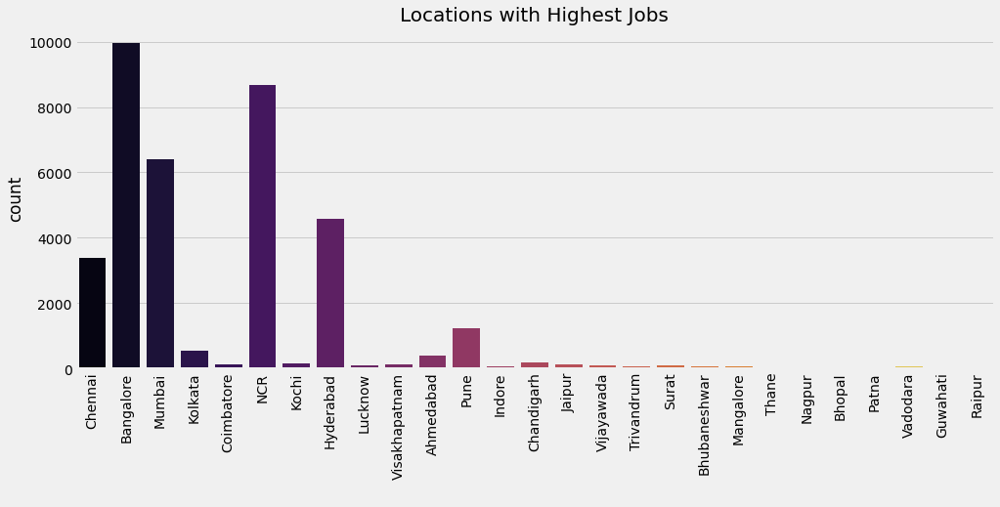

In [18]:
counts = data['joblocation_adress'].value_counts()
data = data.loc[data['joblocation_adress'].isin(counts.index[counts > 25])]
display(data['joblocation_adress'].value_counts())

sns.countplot(data['joblocation_adress'], palette = 'inferno')
plt.title('Locations with Highest Jobs', fontsize = 20)
plt.xlabel(' ')
plt.xticks(rotation = 90)
plt.show()

## Cleaning the Experience Column

In [19]:
data['experience']

0          0 - 1 yrs
1          0 - 0 yrs
2          4 - 8 yrs
3        11 - 15 yrs
3        11 - 15 yrs
            ...     
21996      3 - 5 yrs
21997      2 - 4 yrs
21998     7 - 12 yrs
21998     7 - 12 yrs
21999     5 - 10 yrs
Name: experience, Length: 36723, dtype: object

In [20]:
pd.set_option('max_rows', 40000)
data['experience'].str.split(' ')

0          [0, -, 1, yrs]
1          [0, -, 0, yrs]
2          [4, -, 8, yrs]
3        [11, -, 15, yrs]
3        [11, -, 15, yrs]
3        [11, -, 15, yrs]
3        [11, -, 15, yrs]
3        [11, -, 15, yrs]
4          [6, -, 8, yrs]
5          [2, -, 5, yrs]
6          [1, -, 3, yrs]
6          [1, -, 3, yrs]
6          [1, -, 3, yrs]
6          [1, -, 3, yrs]
6          [1, -, 3, yrs]
6          [1, -, 3, yrs]
6          [1, -, 3, yrs]
6          [1, -, 3, yrs]
7          [2, -, 7, yrs]
8          [1, -, 3, yrs]
9          [1, -, 5, yrs]
10         [1, -, 3, yrs]
10         [1, -, 3, yrs]
10         [1, -, 3, yrs]
11         [4, -, 8, yrs]
12         [2, -, 4, yrs]
13         [3, -, 8, yrs]
14         [1, -, 5, yrs]
15         [5, -, 7, yrs]
16         [1, -, 2, yrs]
17         [2, -, 4, yrs]
18        [5, -, 10, yrs]
19         [0, -, 1, yrs]
20         [1, -, 5, yrs]
21        [5, -, 10, yrs]
22         [3, -, 8, yrs]
23        [6, -, 10, yrs]
24       [10, -, 12, yrs]
25         [

In [21]:
data['experience'] = data['experience'].str.split(" ")
data['Min Experience'] = data['experience'].apply(lambda x: x[0])
data['Max Experience'] = data['experience'].apply(lambda x: x[2] if len(x) > 2 else x[1])

In [22]:
data['Min Experience'].value_counts()

2      7301
0      6340
3      5343
1      4490
5      3329
4      3135
6      1530
10     1430
8      1292
7      1048
9       486
12      315
15      285
Not     111
11       75
13       74
14       63
20       26
18       25
16       16
17        6
25        1
26        1
23        1
Name: Min Experience, dtype: int64

In [23]:
data['Max Experience'].value_counts()

5            6458
7            4494
8            3740
6            3303
3            3233
10           2860
4            2664
9            1815
2            1597
12           1085
1            1064
11           1059
15            834
13            682
20            501
0             358
14            251
18            134
Mentioned     111
16            109
17             94
22             85
25             85
19             27
23             26
24             20
21             12
30             11
28              8
26              1
27              1
-1              1
Name: Max Experience, dtype: int64

In [24]:
data['Min Experience'] = data['Min Experience'].replace('Not',0)
data['Max Experience'] = data['Max Experience'].replace(('Mentioned','-1'), (5,5))

# lets convert thenm into numerical data types
data['Min Experience'] = data['Min Experience'].astype('int')
data['Max Experience'] = data['Max Experience'].astype('int')

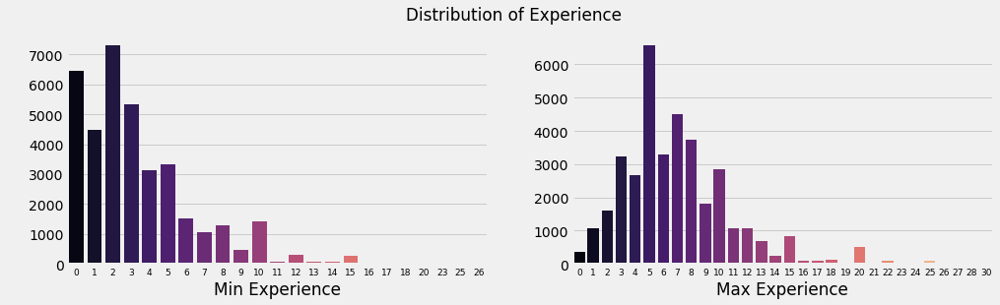

In [25]:
plt.rcParams['figure.figsize'] = (15, 4)

plt.subplot(1, 2, 1)
sns.countplot(data['Min Experience'], palette = 'magma')
plt.xticks(fontsize = 9)
plt.ylabel(" ")

plt.subplot(1, 2, 2)
sns.countplot(data['Max Experience'], palette = 'magma')
plt.xticks(fontsize = 9)
plt.ylabel(" ")

plt.suptitle('Distribution of Experience')
plt.show()

## Cleaning the Education Column

In [26]:
data['education']

0        UG: B.Tech/B.E. - Any Specialization PG:Any Po...
1        UG: B.Tech/B.E. - Any Specialization PG:MBA/PG...
2        UG: Any Graduate - Any Specialization PG:Any P...
3        UG: Any Graduate - Any Specialization PG:CA Do...
3        UG: Any Graduate - Any Specialization PG:CA Do...
3        UG: Any Graduate - Any Specialization PG:CA Do...
3        UG: Any Graduate - Any Specialization PG:CA Do...
3        UG: Any Graduate - Any Specialization PG:CA Do...
4        UG: B.Tech/B.E. - Any Specialization PG:Any Po...
5        UG: B.Tech/B.E. - Any Specialization PG:MCA - ...
6                                                      NaN
6                                                      NaN
6                                                      NaN
6                                                      NaN
6                                                      NaN
6                                                      NaN
6                                                      N

In [27]:
data['education'] = data['education'].fillna('UG: Any Graduate - Any Specialization')
data['education'].isnull().sum()

0

In [28]:
data['Education'] = data['education'].str.split(' ')
data['Education'] = data['Education'].apply(lambda x: x[1] if len(x) > 1 else x[0])

data['Education'].value_counts(dropna = False)

Any                    24216
B.Tech/B.E.             8835
B.Com                    647
B.Sc                     544
Diploma                  441
Graduation               397
B.B.A                    267
B.A                      240
BCA                      174
MBBS                     155
BDS                      109
B.Pharma                  97
Other                     86
B.Ed                      85
LLB                       71
-                         54
BHM                       54
Not                       54
Doctorate                 49
B.Arch                    37
B.Tech/B.E.,              23
B.Sc,                     21
Postgraduate              14
PG:CA                     10
Doctorate:Doctorate        9
B.Pharma,                  7
Diploma,                   5
B.Com,                     5
BVSC                       3
BCA,                       3
B.A,                       3
MBA/PGDM                   2
B.B.A,                     2
BAMS                       1
PG:Other      

In [29]:
# let's do some cleaning

data['Education'] = data['Education'].replace(('B.Tech/B.E.','Graduation','Other','-','Not','B.Tech/B.E.,','Postgraduate',
                                               'PG:CA','Diploma,','B.Com,','B.Pharma,','B.A,','BCA,','B.Sc,','MBA/PGDM','B.B.A,',
                                              'PG:Other','Doctorate:Doctorate','Post'),
                                              ('B.Tech','B.Tech','B.Tech','B.Tech','B.Tech','B.Tech','B.Tech',
                                              'CA','Diploma','B.Com','B.Pharma','B.A','BCA','B.Sc','MBA','BBA',
                                              'B.Tech','Doctorate','B.Tech'))

data['Education'].value_counts()

Any          24216
B.Tech        9464
B.Com          652
B.Sc           565
Diploma        446
B.B.A          267
B.A            243
BCA            177
MBBS           155
BDS            109
B.Pharma       104
B.Ed            85
LLB             71
Doctorate       58
BHM             54
B.Arch          37
CA              10
BVSC             3
BBA              2
MBA              2
B.Des.           1
BAMS             1
BFA              1
Name: Education, dtype: int64

Any          24216
B.Tech        9464
B.Com          652
B.Sc           565
Diploma        446
B.B.A          267
B.A            243
BCA            177
MBBS           155
BDS            109
B.Pharma       104
B.Ed            85
LLB             71
Doctorate       58
BHM             54
B.Arch          37
Name: Education, dtype: int64

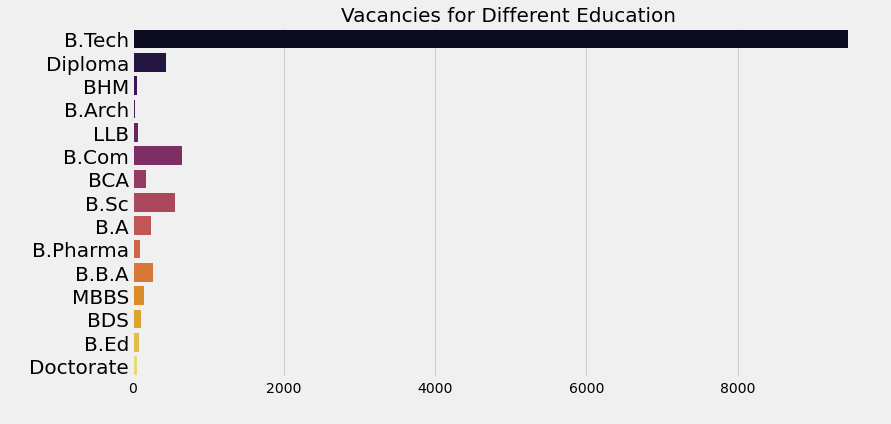

In [30]:
counts = data['Education'].value_counts()
data = data.loc[data['Education'].isin(counts.index[counts >= 25])]
display(data['Education'].value_counts())

plt.rcParams['figure.figsize'] = (12,6)
x = data[data['Education'] != 'Any']
sns.countplot(y = x['Education'], palette = 'inferno')
plt.title('Vacancies for Different Education', fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylabel(" ")
plt.xlabel(" ")
plt.show()

## Cleaning the Industry Column

In [31]:
data['industry']

0                         Media / Entertainment / Internet
1                 Advertising / PR / MR / Event Management
2                          IT-Software / Software Services
3                   Banking / Financial Services / Broking
3                   Banking / Financial Services / Broking
3                   Banking / Financial Services / Broking
3                   Banking / Financial Services / Broking
3                   Banking / Financial Services / Broking
4                          IT-Software / Software Services
5                          IT-Software / Software Services
6                          IT-Software / Software Services
6                          IT-Software / Software Services
6                          IT-Software / Software Services
6                          IT-Software / Software Services
6                          IT-Software / Software Services
6                          IT-Software / Software Services
6                          IT-Software / Software Servic

In [32]:
data['industry'].str.split(' / ')

0                         [Media, Entertainment, Internet]
1                  [Advertising, PR, MR, Event Management]
2                         [IT-Software, Software Services]
3                   [Banking, Financial Services, Broking]
3                   [Banking, Financial Services, Broking]
3                   [Banking, Financial Services, Broking]
3                   [Banking, Financial Services, Broking]
3                   [Banking, Financial Services, Broking]
4                         [IT-Software, Software Services]
5                         [IT-Software, Software Services]
6                         [IT-Software, Software Services]
6                         [IT-Software, Software Services]
6                         [IT-Software, Software Services]
6                         [IT-Software, Software Services]
6                         [IT-Software, Software Services]
6                         [IT-Software, Software Services]
6                         [IT-Software, Software Service

In [33]:
data['industry'].isnull().sum()

1

In [34]:
data['industry'] = data['industry'].fillna(data['industry'].mode()[0])

data['industry'].isnull().sum()

0

IT-Software                 14695
BPO                          2321
Banking                      2111
Education                    1726
Recruitment                  1538
Automobile                   1170
Pharma                       1022
Internet                     1021
Construction                  952
Medical                       873
Travel                        733
Industrial Products           607
Other                         548
Accounting                    547
Strategy                      517
Advertising                   472
IT-Hardware & Networking      442
FMCG                          426
Media                         426
Insurance                     400
Retail                        370
Oil and Gas                   347
Telecom/ISP /                 316
Real Estate                   306
Consumer Electronics          268
Semiconductors                249
Electricals                   243
Textiles                      194
Courier                       183
KPO           

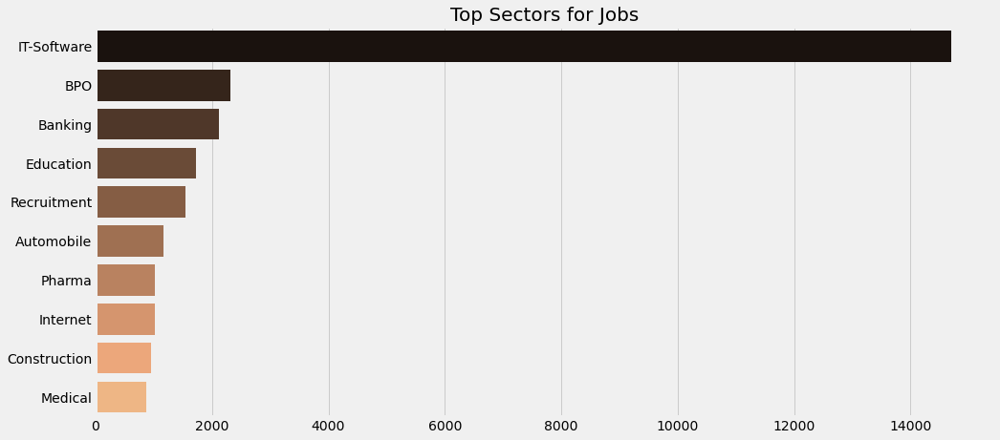

In [35]:
data['Industry'] = data['industry'].str.split(' / ')
data['Industry'] = data['Industry'].apply(lambda x: x[0])

display(data['Industry'].value_counts())

plt.rcParams['figure.figsize'] = (15, 7)
plt.title('Top Sectors for Jobs', fontsize = 20)
sns.barplot(y = data['Industry'].value_counts().head(10).index,
            x = data['Industry'].value_counts().head(10).values,
            palette = 'copper')
plt.show()

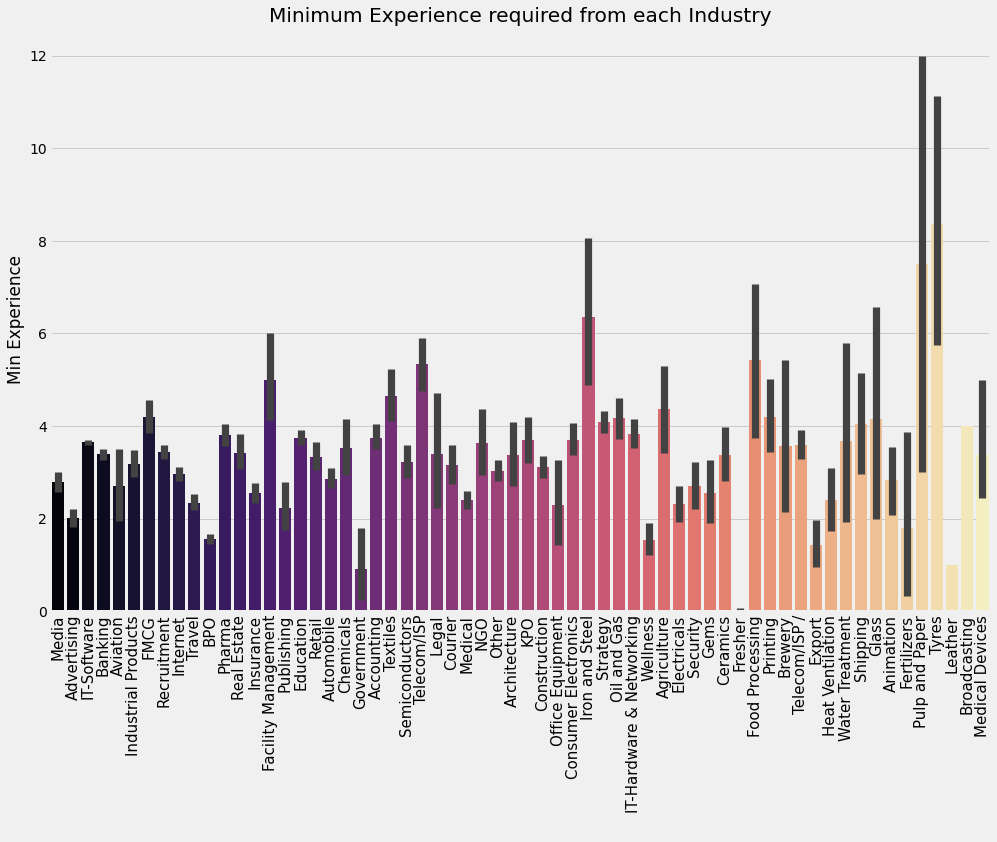

In [36]:
plt.rcParams['figure.figsize'] = (15, 10)
plt.title('Minimum Experience required from each Industry')
sns.barplot(data['Industry'], data['Min Experience'], palette = 'magma')
plt.xticks(fontsize = 15, rotation = 90)
plt.xlabel(' ')
plt.show()

## Cleaning the Skills Column

In [37]:
data['skills'].head(10)

0                                     ITES
1                                Marketing
2    IT Software - Application Programming
3                                 Accounts
3                                 Accounts
3                                 Accounts
3                                 Accounts
3                                 Accounts
4    IT Software - Application Programming
5    IT Software - Application Programming
Name: skills, dtype: object

In [38]:
data['skills'] = data['skills'].fillna(data['skills'].mode()[0])
data['skills'].isnull().sum()

0

Application Programming              9983
Sales                                5932
ITES                                 2952
Production                           1587
Accounts                             1529
HR                                   1455
Teaching                             1351
Marketing                            1327
Medical                               817
Financial Services                    749
Site Engineering                      672
Other                                 634
Engineering Design                    624
ERP                                   564
eCommerce                             529
Network Administration                507
QA & Testing                          479
IT Hardware                           466
Journalism                            427
DBA                                   424
Supply Chain                          379
Embedded                              368
Design                                342
Hotels                            

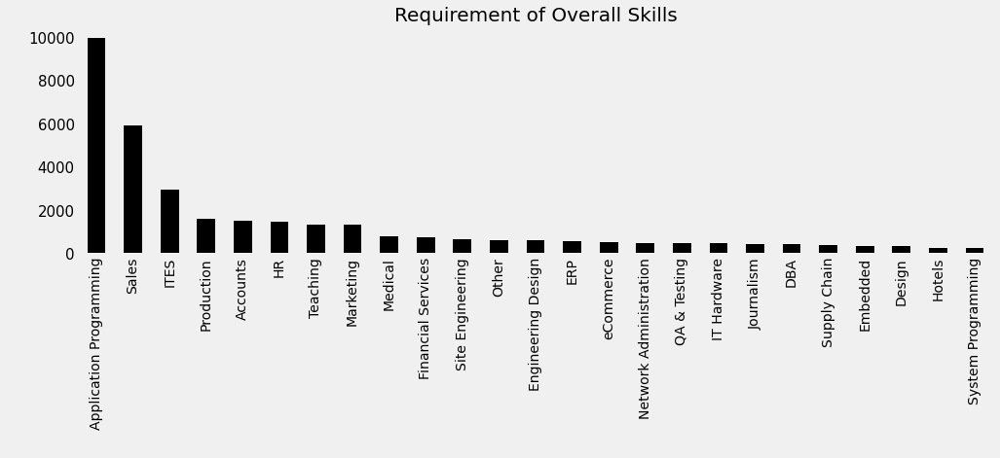

In [39]:
data['Skills'] = data['skills'].str.split(" - ")
data['Skills'] = data['Skills'].apply(lambda x: x[1] if len(x) > 1 else x[0])
display(data['Skills'].value_counts())

plt.rcParams['figure.figsize'] = (15, 4)
plt.title('Requirement of Overall Skills', fontsize = 20)
data['Skills'].value_counts().head(25).plot(kind = 'bar', color = 'black')
plt.grid()
plt.yticks(fontsize = 15)
plt.ylabel(" ")
plt.xlabel(" ")
plt.show()

In [40]:
data[['Skills','numberofpositions']].groupby(['Skills']).agg('sum').sort_values(by = 'numberofpositions',
                                 ascending = False).head(15).style.background_gradient(cmap = 'copper')

,numberofpositions
Skills,
ITES,523255.000000
Medical,90340.000000
Sales,42947.000000
Application Programming,41499.000000
Travel,40040.000000
Marketing,15715.000000
Production,11038.000000
HR,5900.000000
Accounts,4580.000000


## Cleaning rest of the columns

In [41]:
data.columns

Index(['company', 'education', 'experience', 'industry', 'jobdescription',
       'jobid', 'joblocation_address', 'jobtitle', 'numberofpositions',
       'payrate', 'postdate', 'site_name', 'skills', 'uniq_id',
       'joblocation_adress', 'Min Experience', 'Max Experience', 'Education',
       'Industry', 'Skills'],
      dtype='object')

In [42]:
# lets remove the columns which are not required

data = data.drop(['education',
                  'joblocation_address',
                  'experience',
                  'industry',
                  'skills',
                  'jobid',
                  'uniq_id',
                  'site_name'], axis = 1)

data.columns

Index(['company', 'jobdescription', 'jobtitle', 'numberofpositions', 'payrate',
       'postdate', 'joblocation_adress', 'Min Experience', 'Max Experience',
       'Education', 'Industry', 'Skills'],
      dtype='object')

In [43]:
data.isnull().sum()

company                   0
jobdescription            0
jobtitle                  0
numberofpositions     27818
payrate                  93
postdate                 29
joblocation_adress        0
Min Experience            0
Max Experience            0
Education                 0
Industry                  0
Skills                    0
dtype: int64

In [44]:
data['numberofpositions'] = data['numberofpositions'].fillna(1)
data['numberofpositions'] = data['numberofpositions'].astype('int')

# If the job post date and pay rate is missing it is useless, so lets remove the records where jobppostdate is not mentioned
data = data.dropna()
data.isnull().sum().sum()

0

In [45]:
data['postdate'].head()

0    2016-05-21 19:30:00 +0000
1    2016-05-21 19:30:00 +0000
2    2016-10-13 16:20:55 +0000
3    2016-10-13 16:20:55 +0000
3    2016-10-13 16:20:55 +0000
Name: postdate, dtype: object

In [46]:
data['postdate'] = data['postdate'].str.split(" ")
data['postdate'] = data['postdate'].apply(lambda x: x[0])
data['postdate'].head()

0    2016-05-21
1    2016-05-21
2    2016-10-13
3    2016-10-13
3    2016-10-13
Name: postdate, dtype: object

In [47]:
# By looking at the above result we can easily analyze that there are some duplicate

# lets print the no. of rows before removing Duplicates
print("No. of Rows Before Removing Duplicates: ",data.shape[0])

# so lets remove all the duplicates from the data
data.drop_duplicates(subset = None, keep = 'first', inplace = True)

# lets print the no. of rows after removing Duplicates
print("No. of Rows After Removing Duplicates: ",data.shape[0])

No. of Rows Before Removing Duplicates:  36581
No. of Rows After Removing Duplicates:  32137


## Let's Gather some Vital Information from Data 

In [48]:
data['company'].nunique()

8278

In [49]:
data['jobtitle'].nunique()

17083

In [50]:
data['Skills'].nunique()

45

In [51]:
data['Industry'].nunique()

62

In [52]:
data['joblocation_adress'].nunique()

27

In [53]:
data['numberofpositions'].sum()

588065

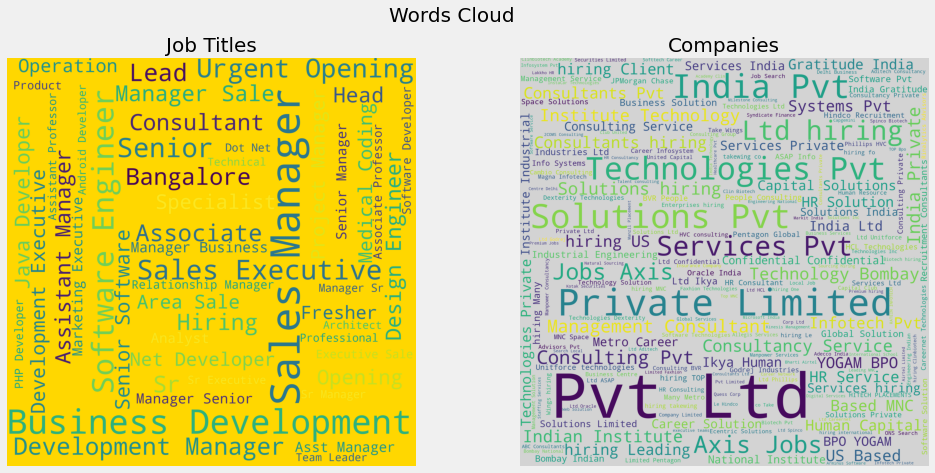

In [54]:
# checking the most popular job titles

from wordcloud import WordCloud
from wordcloud import STOPWORDS

stopwords = set(STOPWORDS)
wordcloud = WordCloud(background_color = 'gold',
                      max_words = 50,
                      stopwords = stopwords,
                      width = 2000,
                      height = 2000).generate(str(data['jobtitle']))

wordcloud2 = WordCloud(background_color = 'lightgrey',
                       stopwords = stopwords,
                       width = 2000,
                       height = 2000).generate(str(data['company']))


plt.rcParams['figure.figsize'] = (15, 7)

plt.subplot(1, 2, 1)
plt.imshow(wordcloud)
plt.title('Job Titles', fontsize = 20)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(wordcloud2)
plt.title('Companies', fontsize = 20)
plt.axis('off')

plt.suptitle('Words Cloud', fontsize = 20)
plt.show()

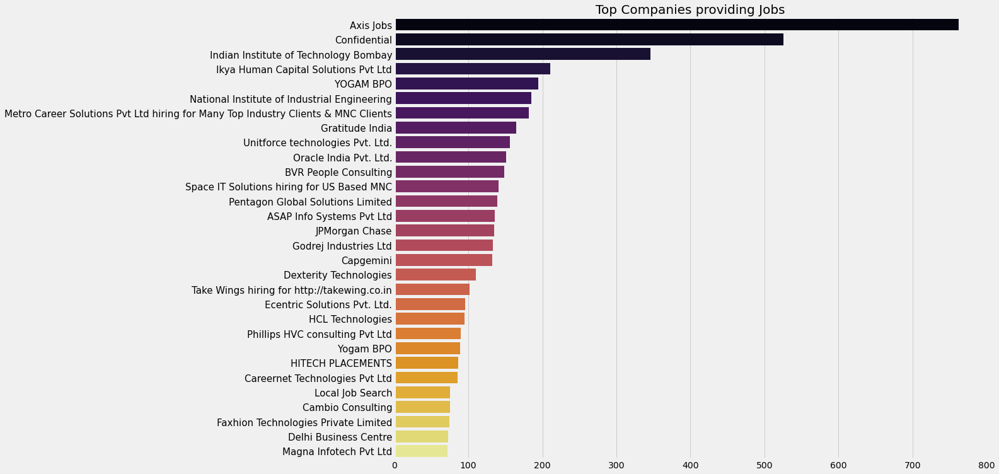

In [55]:
# lets check the top 20 companies providing jobs

plt.rcParams['figure.figsize'] = (15, 12)
sns.barplot(y = data['company'].value_counts().head(30).index,
            x = data['company'].value_counts().head(30).values,
            palette = 'inferno')
plt.title('Top Companies providing Jobs', fontsize = 20)
plt.yticks(fontsize = 15)
plt.show()

## Searching for Jobs

In [56]:
pd.set_option('max_rows', 150)
@interact

def check(City = list(data['joblocation_adress'].value_counts().index),
          Industry = list(data['Industry'].value_counts().index),
          Experience = list(data['Min Experience'].value_counts().sort_values(ascending = False).index),
          Vacancies = 10
          ):
    return data.loc[(data['numberofpositions'] > Vacancies)
                   & (data['joblocation_adress'] == City)
                   & (data['Industry'] == Industry)
                   & (data['Min Experience'] == Experience)][[
                                                      'company',
                                                      'jobtitle',
                                                      'Education',
                                                      'payrate',
                                                      'numberofpositions',
                                                      ]]

interactive(children=(Dropdown(description='City', options=('Bangalore', 'NCR', 'Mumbai', 'Hyderabad', 'Chenna…

## Correlation between Industries and Education

In [57]:
# lets create a matrix of skills vs jobtitle
# this matrix will be used for predicting the best suited job titles with respect to the skills
x = pd.crosstab(data['Education'],data['Industry'])
x

Industry,Accounting,Advertising,Agriculture,Animation,Architecture,Automobile,Aviation,BPO,Banking,Brewery,...,Semiconductors,Shipping,Strategy,Telecom/ISP,Telecom/ISP /,Textiles,Travel,Tyres,Water Treatment,Wellness
Education,,,,,,,,,,,,,,,,,,,,,
Any,371,300,50,12,49,758,17,1525,1479,7,...,124,34,357,87,174,137,488,7,11,76
B.A,1,7,0,0,2,0,0,1,0,0,...,0,0,4,1,0,1,1,0,0,4
B.Arch,0,0,0,0,14,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
B.B.A,3,4,0,0,0,4,0,6,19,0,...,1,0,0,0,2,0,12,0,0,0
B.Com,74,5,1,1,0,16,0,34,97,0,...,3,0,25,0,11,6,14,0,0,0
B.Ed,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
B.Pharma,0,0,0,0,0,0,0,5,0,0,...,0,0,0,0,0,0,0,0,0,0
B.Sc,7,0,1,0,0,1,1,10,5,0,...,1,1,0,0,0,0,13,0,0,3
B.Tech,49,54,8,7,16,266,15,287,265,0,...,95,2,87,29,84,13,43,1,3,10


In [58]:
@interact
def recommendation_jobs(Industry = list(data['Industry'].value_counts().index)):
    job = x[Industry]
    similar_jobs = x.corrwith(job)
    similar_jobs = similar_jobs.sort_values(ascending=False)
    similar_jobs = similar_jobs.iloc[2:]
    return similar_jobs.head(3)

interactive(children=(Dropdown(description='Industry', options=('IT-Software', 'BPO', 'Banking', 'Education', …